<a href="https://colab.research.google.com/github/KristynaPijackova/Tutorials_NNs_and_signals/blob/main/DeepLayers22_DL_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

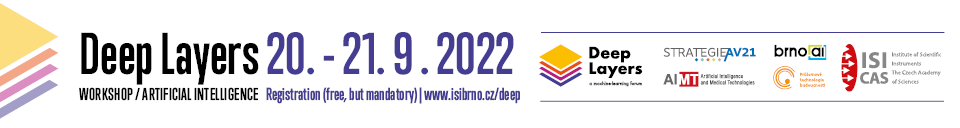

# Hands On Deep Learning Architectures
Author: Kristyna Pijackova 

Other learning resources you might follow:



> https://keras.io/examples/

> Chollet, Francois. *Deep learning with Python* Simon and Schuster, 2021.

> Géron, Aurélien. *Hands-on machine learning with Scikit-Learn, Keras, and TensorFlow: Concepts, tools, and techniques to build intelligent systems* " O'Reilly Media, Inc.", 2019.

# Download the data

For this tutorial, we are going to use one of the classical image classification datasets - Dog vs Cat

In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2022-09-18 12:26:59--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 72.247.96.197, 2600:1409:d000:5a0::317f, 2600:1409:d000:59c::317f
Connecting to download.microsoft.com (download.microsoft.com)|72.247.96.197|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

sanddogs_5340.zip    55%[==========>         ] 436.18M   112MB/s    eta 4s     ^C


In [ ]:
!unzip kagglecatsanddogs_5340.zip

Výstupní stream byl oříznut na posledních 5000 řádků.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jp

# Libraries

In [ ]:
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications.vgg16 import VGG16

# Data Pre-Processing

Clean the data - removing files with ".JFIF" extension

In [ ]:
num_skipped = 0
for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join("PetImages", folder_name)
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)
        try:
            fobj = open(fpath, "rb")
            is_jfif = tf.compat.as_bytes("JFIF") in fobj.peek(10)
        finally:
            fobj.close()

        if not is_jfif:
            num_skipped += 1
            # Delete corrupted image
            os.remove(fpath)

print("Deleted %d images" % num_skipped)

Deleted 1590 images


## Let's plot the images


In [ ]:
cat_path = '/content/PetImages/Cat/'
dog_path = '/content/PetImages/Dog/'

In [ ]:
for i in range(3):
    img = cv2.imread(cat_path + os.listdir(cat_path)[i])
    print('Image Shape: {} \nMax Value: {} \nMin Value: {}\n'.format(img.shape, np.max(img), np.min(img)))

Image Shape: (375, 500, 3) 
Max Value: 225 
Min Value: 0

Image Shape: (75, 128, 3) 
Max Value: 255 
Min Value: 0

Image Shape: (500, 262, 3) 
Max Value: 243 
Min Value: 0



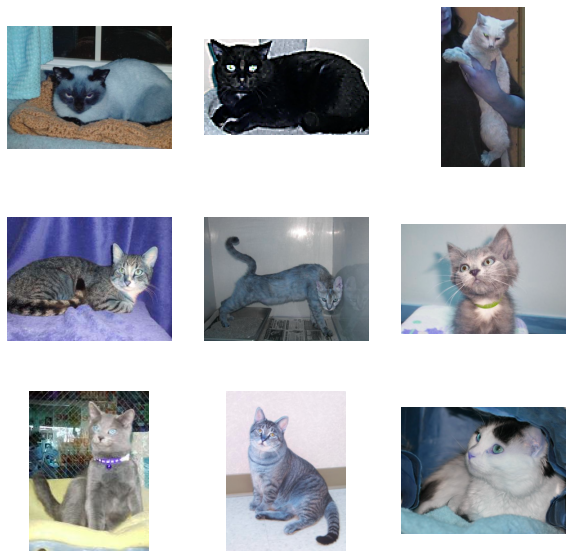

In [ ]:
plt.figure(figsize=(10, 10)) 
for i, image_name in enumerate(os.listdir(cat_path)):
    if i < 9:
        plt.subplot(331 + i)
        img = cv2.imread(cat_path + image_name)    
        plt.imshow(img/255.)
    plt.axis('off')

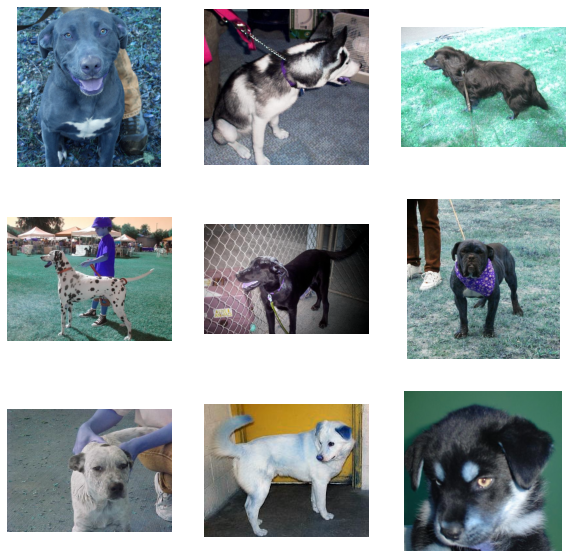

In [ ]:
plt.figure(figsize=(10, 10)) 
for i, image_name in enumerate(os.listdir(dog_path)):
    if i < 9:
        plt.subplot(331 + i)
        img = cv2.imread(dog_path + image_name)    
        plt.imshow(img/255.)
    plt.axis('off')

## Create Dataset Object

In this step, we create a dataset object in Keras, which splits our data into training, validation and test subgroups and will load the data in batches into the model.

In [ ]:
train_ds = keras.utils.image_dataset_from_directory(
    directory='/content/PetImages/',
    labels='inferred',
    label_mode='categorical',
    validation_split=0.4,
    subset='training',
    seed=2022,
    batch_size=64,
    image_size=(256, 256))

test_ds = keras.utils.image_dataset_from_directory(
    directory='/content/PetImages/',
    labels='inferred',
    label_mode='categorical',
    validation_split=0.15,
    subset='validation',
    seed=2022,
    batch_size=64,
    image_size=(256, 256))

val_ds = keras.utils.image_dataset_from_directory(
    directory='/content/PetImages/',
    labels='inferred',
    label_mode='categorical',
    validation_split=0.05,
    subset='validation',
    seed=2022,
    batch_size=64,
    image_size=(256, 256))

Found 23410 files belonging to 2 classes.
Using 14046 files for training.
Found 23410 files belonging to 2 classes.
Using 3511 files for validation.
Found 23410 files belonging to 2 classes.
Using 1170 files for validation.


We can access a sample of one bacth as follows...

In [ ]:
image_batch, labels_batch = next(iter(train_ds))

In [ ]:
image_batch

<tf.Tensor: shape=(64, 256, 256, 3), dtype=float32, numpy=
array([[[[1.70000000e+01, 5.00000000e+00, 7.00000000e+00],
         [2.88788605e+01, 1.68788605e+01, 1.88788605e+01],
         [4.14387512e+01, 2.94387512e+01, 3.14387512e+01],
         ...,
         [9.20103149e+01, 4.00103149e+01, 1.80103149e+01],
         [8.55624847e+01, 3.35624847e+01, 1.15624847e+01],
         [1.03089844e+02, 5.10898438e+01, 2.90898438e+01]],

        [[1.77265625e+01, 5.72656250e+00, 7.72656250e+00],
         [2.63592377e+01, 1.43592377e+01, 1.63592377e+01],
         [3.64881287e+01, 2.44881287e+01, 2.64881287e+01],
         ...,
         [9.67736664e+01, 4.47736664e+01, 2.27736664e+01],
         [9.23905792e+01, 4.03905792e+01, 1.83905792e+01],
         [1.11000000e+02, 5.90000000e+01, 3.70000000e+01]],

        [[2.08164062e+01, 8.81640625e+00, 1.08164062e+01],
         [2.56754761e+01, 1.36754761e+01, 1.56754761e+01],
         [3.42460938e+01, 2.22460938e+01, 2.42460938e+01],
         ...,
         [

In [ ]:
labels_batch

<tf.Tensor: shape=(64, 2), dtype=float32, numpy=
array([[0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],

Let's look what the images in the batch are...

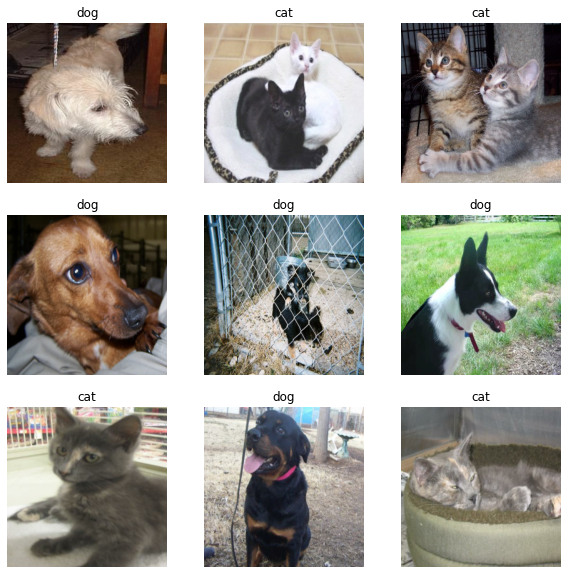

In [ ]:
classes = ['cat', 'dog']

plt.figure(figsize=(10, 10)) 
for i, image in enumerate(image_batch):
    if i < 9:
        plt.subplot(331 + i)    
        plt.imshow(image/255.)
        plt.title(classes[np.argmax(labels_batch[i])])
    plt.axis('off')

## Data Augmentation

In Keras, we can create a Sequential module with augmentation techniques, which can be added to our model as one of the layers and will be active during training, but not during testing phase. 

Augmentation adds slightly modified data to our initial dataset, thus making it more diverse, which might help us against overfitting and might make our model more robust...

In [ ]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(1),
    layers.RandomContrast(0.4),
    layers.RandomZoom(0.2),
    layers.GaussianNoise(0.05)
])

In [ ]:
IMG_SIZE = 180

resize_and_rescale = keras.Sequential([
  layers.Resizing(IMG_SIZE, IMG_SIZE),
  layers.Rescaling(1./255)
])


(-0.5, 255.5, 255.5, -0.5)

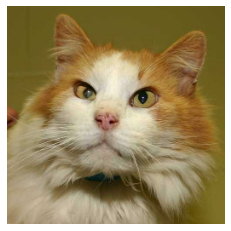

In [ ]:
image, label = next(iter(train_ds))
plt.imshow(image[0]/255.)
plt.axis('off')

(-0.5, 179.5, 179.5, -0.5)

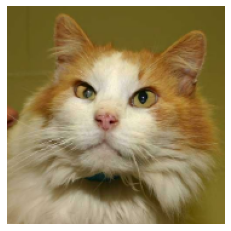

In [ ]:
result = resize_and_rescale(image)
_ = plt.imshow(result[0])
plt.axis('off')

(-0.5, 179.5, 179.5, -0.5)

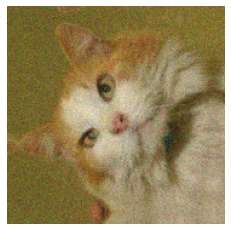

In [ ]:
result = data_augmentation(result, training=True)
_ = plt.imshow(result[0])
plt.axis('off')

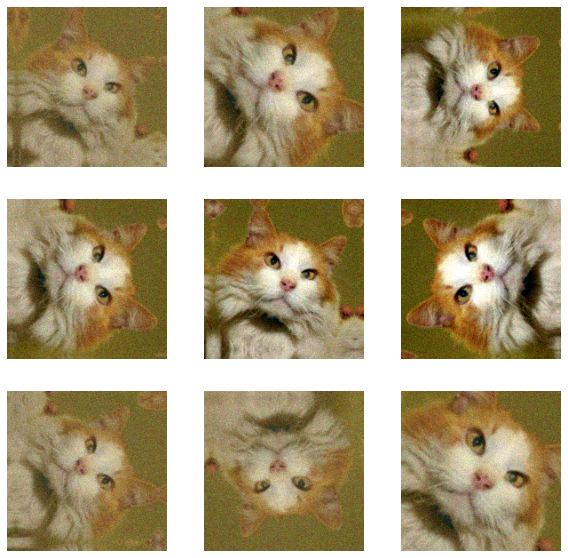

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(9):
  augmented_image = data_augmentation(resize_and_rescale(image), training=True)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image[0])
  plt.axis("off")

# Define a Model

In this section, we create a simple convolutional neural network. Feel free to play around with the number of layers, their hyperparameters (# of filters, kernels, activations,...) to see, how they affect the model's performance.

In [ ]:
num_classes = 2

model = keras.Sequential(
    [
        keras.Input(shape=(256, 256, 3)),
        # resize_and_rescale,
        # data_augmentation,
        layers.Rescaling(1./255),
        layers.Conv2D(128, kernel_size=(5, 5), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dropout(0.8),
        layers.Dense(2, activation="softmax"),
    ]
)

model.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_55 (Rescaling)    (None, 256, 256, 3)       0         
                                                                 
 conv2d_40 (Conv2D)          (None, 252, 252, 128)     9728      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 126, 126, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 124, 124, 64)      73792     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 62, 62, 64)       0         
 g2D)                                                            
                                                                 
 flatten_20 (Flatten)        (None, 246016)          

## Let's train a model

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"])

epochs = 10
history = model.fit(train_ds, epochs=epochs, validation_data=val_ds)

Epoch 1/10
220/220 [==============================] - 68s 306ms/step - loss: 0.7166 - accuracy: 0.5234 - val_loss: 0.6871 - val_accuracy: 0.5487
Epoch 2/10
220/220 [==============================] - 68s 306ms/step - loss: 0.6737 - accuracy: 0.5884 - val_loss: 0.6556 - val_accuracy: 0.6077
Epoch 3/10
220/220 [==============================] - 70s 317ms/step - loss: 0.6600 - accuracy: 0.6062 - val_loss: 0.6524 - val_accuracy: 0.6265
Epoch 4/10
220/220 [==============================] - 69s 308ms/step - loss: 0.6588 - accuracy: 0.6152 - val_loss: 0.6491 - val_accuracy: 0.6342
Epoch 5/10
220/220 [==============================] - 68s 306ms/step - loss: 0.6466 - accuracy: 0.6271 - val_loss: 0.6430 - val_accuracy: 0.6521
Epoch 6/10
220/220 [==============================] - 69s 311ms/step - loss: 0.6397 - accuracy: 0.6367 - val_loss: 0.6638 - val_accuracy: 0.6145
Epoch 7/10
220/220 [==============================] - 70s 312ms/step - loss: 0.6346 - accuracy: 0.6482 - val_loss: 0.6421 - val_ac

## Plot the training accuracy and

We can plot the values of training and validation losses and accuracies for each epoch. 

This can give us at least a slight idea about the training process - are we overfitting, underfitting, is the training ok? 

As a rule of thumb:

*   if validation and train loss follow ~same curve, the training is okay
*   if the training loss is getting lower, but the validation loss rises, something is wrong and you are overfitting your model on your training data (it won't generalize well on test data) - try a model with less parameters, add dropout layers, introduce data augmentation... 

*   if the validation loss is lower than the training loss, it means you are underfitting and you might improve the model performance if you continue training



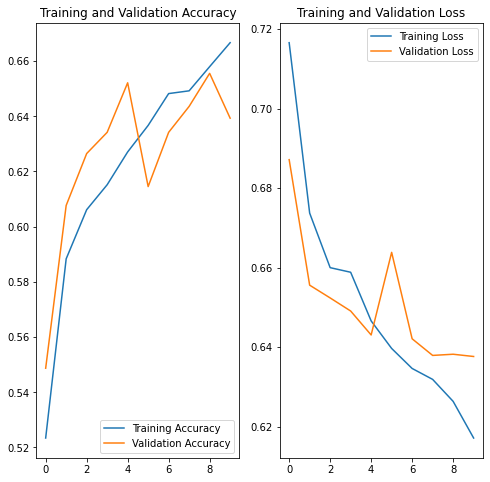

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Print loss and accuracy on test dataset

In [ ]:
test_loss, test_acc = model.evaluate(test_ds)

print("Test accuracy: \t", test_acc)
print("Test loss: \t", test_loss)

55/55 [==============================] - 9s 156ms/step - loss: 0.6441 - accuracy: 0.6428
Test accuracy: 	 0.6428368091583252
Test loss: 	 0.6440798044204712


# Let's predict the output on a new images

We will test the trained model on images, which are not from the imported dataset, but rather our own to see how it does on completely new data (or maybe it's just an excuse to look at more dogs' and cats' pictures...)

In [ ]:
!gdown 1IJ7vCleSa4CZ0qsEvE6ra84P9qDN18b-

Downloading...
From: https://drive.google.com/uc?id=1IJ7vCleSa4CZ0qsEvE6ra84P9qDN18b-
To: /content/OwnPets.zip
100% 33.9M/33.9M [00:00<00:00, 228MB/s]


In [ ]:
!unzip OwnPets.zip

Archive:  OwnPets.zip
   creating: OwnPets/
  inflating: OwnPets/142841781_794272154766939_6037712883513353832_n.jpg  
  inflating: OwnPets/118347949_665067731070560_2119625076121092279_n.jpg  
  inflating: OwnPets/142721162_1099667693837050_6382182228925847902_n.jpg  
  inflating: OwnPets/147712267_240922064256268_2947636367679659112_n.jpg  
  inflating: OwnPets/IMG_20200527_151924.jpg  
  inflating: OwnPets/118713552_1033097157128938_2617846513907388764_n.jpg  
  inflating: OwnPets/photo1640355291.jpg  
  inflating: OwnPets/IMG_20200527_155715.jpg  
  inflating: OwnPets/307121310_608118164306033_2463757378502998343_n.png  
  inflating: OwnPets/160998779_488773189166349_496711918852912772_n.jpg  
  inflating: OwnPets/105612121_318476025834107_4998124123486220096_n.jpg  
  inflating: OwnPets/92246118_919712995126315_5725963194011222016_n.jpg  
  inflating: OwnPets/307092832_3184308468497536_6065450090624332882_n.jpg  
  inflating: OwnPets/IMG_20160826_191115.jpg  
  inflating: OwnPets/


This image most likely belongs to cat with a 57.75 percent confidence.


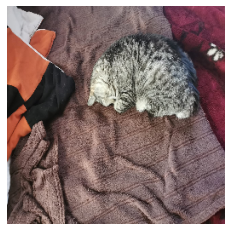


This image most likely belongs to cat with a 61.63 percent confidence.


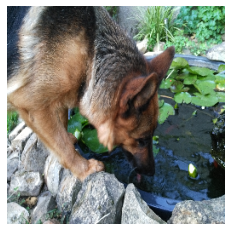


This image most likely belongs to dog with a 71.07 percent confidence.


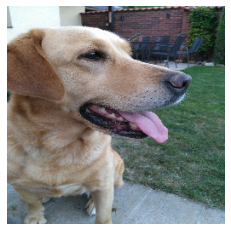


This image most likely belongs to dog with a 52.95 percent confidence.


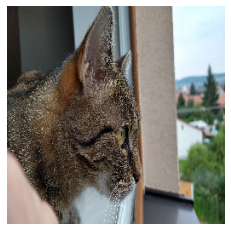


This image most likely belongs to dog with a 59.20 percent confidence.


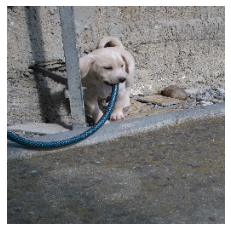


This image most likely belongs to dog with a 57.66 percent confidence.


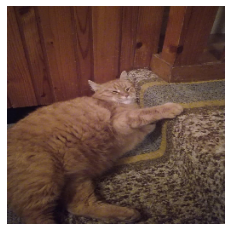


This image most likely belongs to dog with a 72.22 percent confidence.


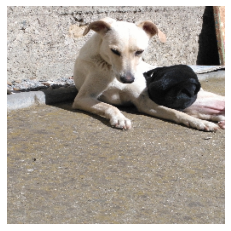


This image most likely belongs to cat with a 63.43 percent confidence.


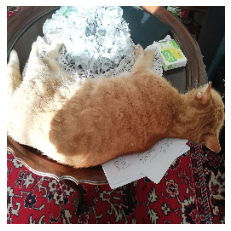


This image most likely belongs to dog with a 58.35 percent confidence.


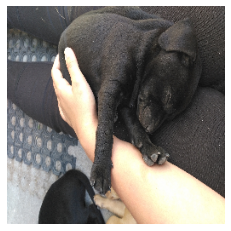


This image most likely belongs to dog with a 50.68 percent confidence.


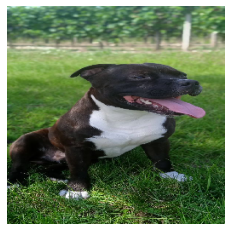


This image most likely belongs to dog with a 65.29 percent confidence.


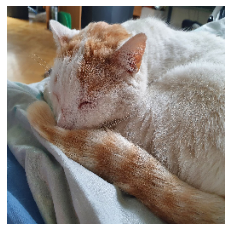


This image most likely belongs to dog with a 61.85 percent confidence.


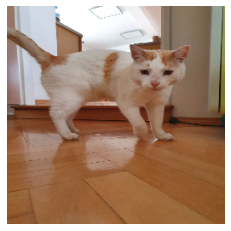


This image most likely belongs to dog with a 65.83 percent confidence.


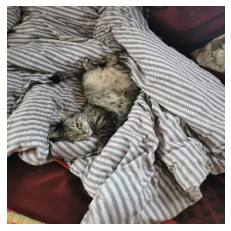


This image most likely belongs to dog with a 60.29 percent confidence.


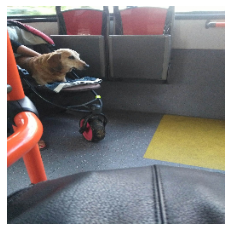


This image most likely belongs to dog with a 64.38 percent confidence.


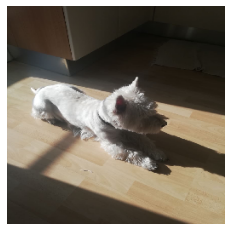


This image most likely belongs to dog with a 67.20 percent confidence.


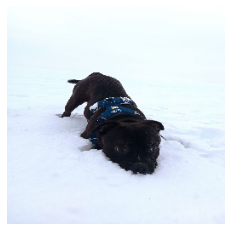


This image most likely belongs to dog with a 57.00 percent confidence.


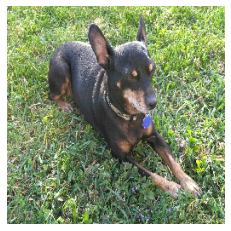


This image most likely belongs to dog with a 53.69 percent confidence.


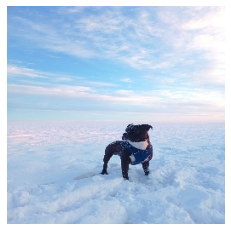


This image most likely belongs to dog with a 64.64 percent confidence.


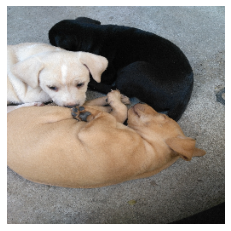


This image most likely belongs to dog with a 60.39 percent confidence.


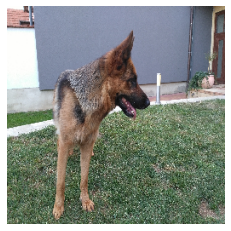


This image most likely belongs to dog with a 60.85 percent confidence.


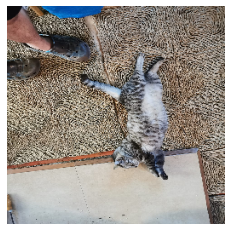


This image most likely belongs to dog with a 55.61 percent confidence.


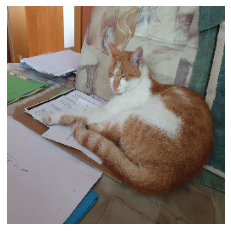


This image most likely belongs to dog with a 54.10 percent confidence.


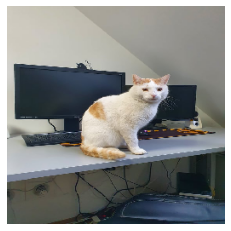


This image most likely belongs to dog with a 66.39 percent confidence.


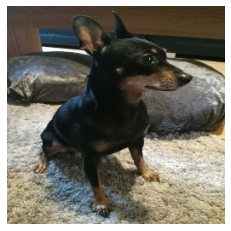

In [ ]:
for image_name in os.listdir('/content/OwnPets/'):
    img = tf.keras.utils.load_img('/content/OwnPets/' + image_name, target_size=(256, 256))  # load image
    img_array = tf.keras.utils.img_to_array(img)  # create an array from the image
    img_array_batch = tf.expand_dims(img_array, 0) # create a batch

    predictions = model.predict(img_array_batch)  # make predictions
    score = tf.nn.softmax(predictions[0])  # get the value output range(0, 1)

    print(
        "\nThis image most likely belongs to {} with a {:.2f} percent confidence."
        .format(classes[np.argmax(score)], 100 * np.max(score))
    )

    plt.imshow(img_array/255)
    plt.axis('off')
    plt.show()

# DL model does not have to be a black box...
## ...visualizing filter maps and activations


Often you'll hear, that deep learning is like "black box" and nobody has no idea, what is going on inside... Well, while that might be true in some cases and while the inner workings of the model might not always make sense to us, with a simple CNN models, you can quite easily see what is going on inside of the blackbox!

Let's print model's layers and their output sizes...

In [ ]:
layer_names = [layer.name for layer in model.layers]
layer_outputs = [layer.output for layer in model.layers]

In [ ]:
for layer in model.layers:
    print("\nLayer name: \t{} \nLayer output: \t{}".format(layer.name, layer.output))


Layer name: 	rescaling_55 
Layer output: 	KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), name='rescaling_55/add:0', description="created by layer 'rescaling_55'")

Layer name: 	conv2d_40 
Layer output: 	KerasTensor(type_spec=TensorSpec(shape=(None, 252, 252, 128), dtype=tf.float32, name=None), name='conv2d_40/Relu:0', description="created by layer 'conv2d_40'")

Layer name: 	max_pooling2d_16 
Layer output: 	KerasTensor(type_spec=TensorSpec(shape=(None, 126, 126, 128), dtype=tf.float32, name=None), name='max_pooling2d_16/MaxPool:0', description="created by layer 'max_pooling2d_16'")

Layer name: 	conv2d_41 
Layer output: 	KerasTensor(type_spec=TensorSpec(shape=(None, 124, 124, 64), dtype=tf.float32, name=None), name='conv2d_41/Relu:0', description="created by layer 'conv2d_41'")

Layer name: 	max_pooling2d_17 
Layer output: 	KerasTensor(type_spec=TensorSpec(shape=(None, 62, 62, 64), dtype=tf.float32, name=None), name='max_pooling2d_17/MaxPool:

## Activation maps...

We can pass through the layers in our model and see, what fiters were activated and how much for the predicted image we currently choose to pass through the model.

In [ ]:
activation_model = tf.keras.models.Model(model.input, layer_outputs)

In [ ]:
activations = activation_model.predict(img_array_batch)

(1, 252, 252, 128)


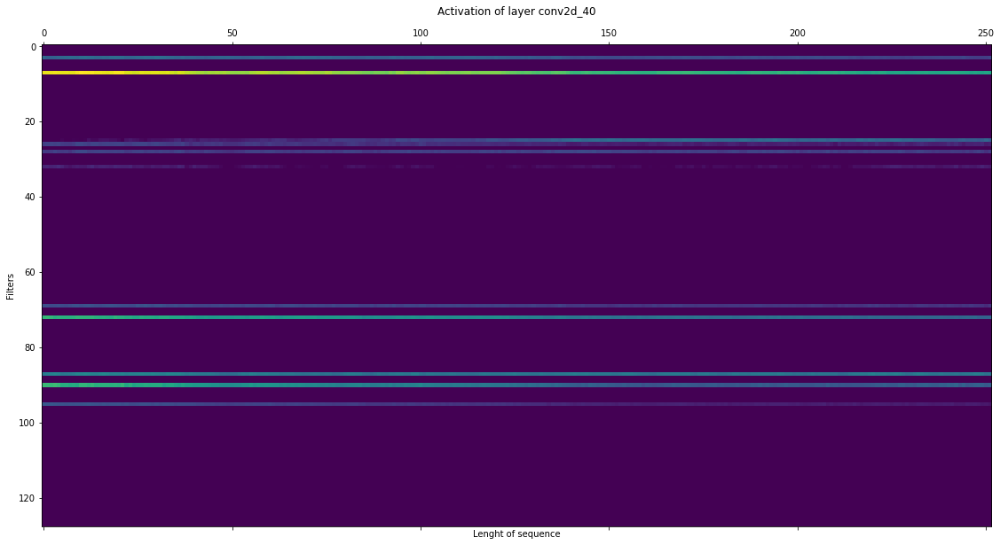

In [ ]:
LAYER = 1  # choose which layer you want to see

activation_layer = activations[LAYER]
print(activation_layer.shape)
activation_layer = np.transpose(activation_layer[0,:,:,:],(0,2,1)) # reshape
fig, ax = plt.subplots(figsize=(20,10))
ax.matshow(activation_layer[0,:,:],  cmap='viridis')
plt.title('Activation of layer ' + layer_names[LAYER])
ax.grid(False)
ax.set_xlabel('Lenght of sequence')
ax.set_ylabel('Filters')
fig.show()


## Filters...

By extracting weights, we can see, how the filter, which are then applied on the processed image, look like...

In [ ]:
# retrieve weights from the second hidden layer
filters, biases = model.layers[LAYER].get_weights()
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

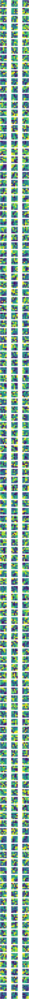

<Figure size 432x288 with 0 Axes>

In [ ]:
# plot first few filters
n_filters= filters.shape[-1]
ix = 1
plt.figure(figsize=(16, n_filters*4)) 
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel separately
	for j in range(3):
		# specify subplot and turn of axis
		ax = plt.subplot(n_filters, 3, ix)
		plt.imshow(f[:, :, j])
		plt.axis('off')
		ix += 1
# show the figure
plt.show()
plt.tight_layout()


## Feature maps...

...shows us, how the image looks like, after each filter is applied.

Model: "model_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_102 (InputLayer)      [(None, 256, 256, 3)]     0         
                                                                 
 rescaling_55 (Rescaling)    (None, 256, 256, 3)       0         
                                                                 
 conv2d_40 (Conv2D)          (None, 252, 252, 128)     9728      
                                                                 
Total params: 9,728
Trainable params: 9,728
Non-trainable params: 0
_________________________________________________________________


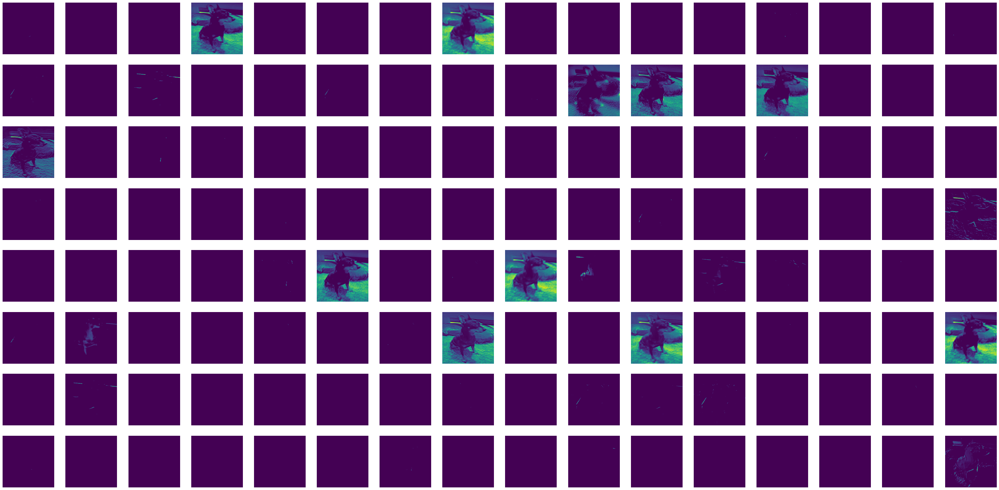

In [ ]:
output = keras.models.Model(inputs=model.inputs, outputs=model.layers[LAYER].output)
output.summary()
# load the image with the required shape

feature_maps = output.predict(img_array_batch)
# plot all 64 maps in an 8x8 squares
rows = 8
columns = int(feature_maps.shape[-1]/rows)
ix = 1
plt.figure(figsize=(columns*3, rows*3)) 
for _ in range(rows):
    for _ in range(columns):
		# specify subplot and turn of axis
        ax = plt.subplot(rows, columns, ix)
        plt.imshow(feature_maps[0, :, :, ix-1])
        plt.axis('off')
        ix += 1
        

## Filters and Feature Maps together

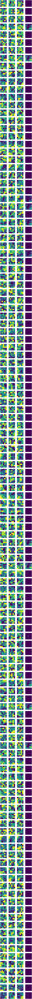

<Figure size 432x288 with 0 Axes>

In [ ]:
# plot first few filters
n_filters= filters.shape[-1]
ix = 1
plt.figure(figsize=(16, n_filters*4)) 
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel separately
	for j in range(3):
		# specify subplot and turn of axis
		ax = plt.subplot(n_filters, 4, ix)
		plt.imshow(f[:, :, j])
		plt.axis('off')
		ix += 1
		# show the img actitvation as well
		if j == 2:
			ax = plt.subplot(n_filters, 4, ix)
			plt.imshow(feature_maps[0, :, :, i])
			plt.axis('off')
			ix += 1
# show the figure
plt.show()
plt.tight_layout()




# A little bit of transer learning...

So transfer learning is a way, how to utilize already trained models for our need. Those models have trained weights, which most probably learned some stuff, which we can use as well for our dataset. 

You can thus load the models with the pretrained weight, maybe change the classifier head (the last part with the dense layers) to fit your data and retrain just this part. If that is not enough, you might also want to retrain the part with the conv layers, but here you should be more carefull (so read something about it first, so you won't ruin the purpose of the transfer learning...)


You can find the pretrained models from keras over here:
https://keras.io/api/applications/

And in the following code an example how to use it for your own data and classification.

## Load the model, add custom classifier head and train...

In [ ]:
base_model = keras.applications.MobileNetV3Small(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(256, 256, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

inputs = keras.Input(shape=(256, 256, 3))
# x = keras.layers.Rescaling(1./255)(inputs)  # rescale if needed, but MobileNet takes care of this on its own
x = keras.layers.Rescaling(1./1)(inputs)
# x = data_augmentation(x)  # try adding data augmentation defined earlier
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
outputs = keras.layers.Dense(2, activation='softmax')(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "model_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_106 (InputLayer)      [(None, 256, 256, 3)]     0         
                                                                 
 rescaling_59 (Rescaling)    (None, 256, 256, 3)       0         
                                                                 
 MobilenetV3small (Functiona  (None, 8, 8, 576)        939120    
 l)                                                              
                                                                 
 global_average_pooling2d_26  (None, 576)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_63 (Dense)            (None, 2)                 1154      
                                                                 
Total params: 940,274
Trainable params: 928,162
Non-traina

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

epochs = 4
history = model.fit(train_ds, epochs=epochs, callbacks=callback, validation_data=val_ds)

Epoch 1/4
220/220 [==============================] - 47s 191ms/step - loss: 0.1101 - accuracy: 0.9538 - val_loss: 0.0677 - val_accuracy: 0.9786
Epoch 2/4
220/220 [==============================] - 43s 190ms/step - loss: 0.0711 - accuracy: 0.9717 - val_loss: 0.0807 - val_accuracy: 0.9718
Epoch 3/4
220/220 [==============================] - 43s 193ms/step - loss: 0.0553 - accuracy: 0.9786 - val_loss: 0.0837 - val_accuracy: 0.9709
Epoch 4/4
220/220 [==============================] - 44s 195ms/step - loss: 0.0380 - accuracy: 0.9863 - val_loss: 0.0426 - val_accuracy: 0.9863


## Print loss and accuracy on test dataset

In [ ]:
test_loss, test_acc = model.evaluate(test_ds)

print("Test accuracy: \t", test_acc)
print("Test loss: \t", test_loss)

55/55 [==============================] - 6s 102ms/step - loss: 0.0511 - accuracy: 0.9821
Test accuracy: 	 0.9820563793182373
Test loss: 	 0.051081083714962006


# Let's predict the output on a new image


This image most likely belongs to cat with a 64.68 percent confidence.


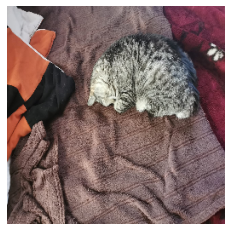


This image most likely belongs to dog with a 63.65 percent confidence.


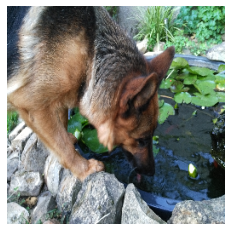


This image most likely belongs to dog with a 73.11 percent confidence.


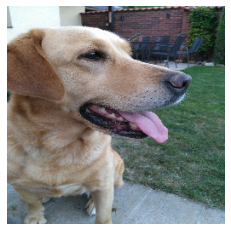


This image most likely belongs to cat with a 71.71 percent confidence.


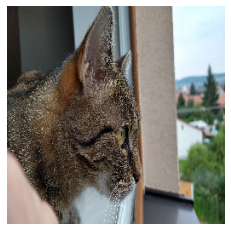


This image most likely belongs to dog with a 72.73 percent confidence.


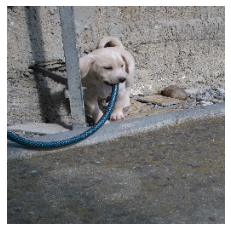


This image most likely belongs to cat with a 63.47 percent confidence.


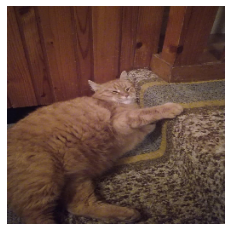


This image most likely belongs to dog with a 73.05 percent confidence.


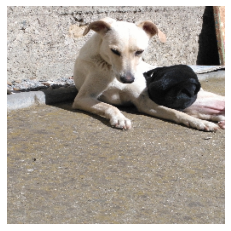


This image most likely belongs to cat with a 67.92 percent confidence.


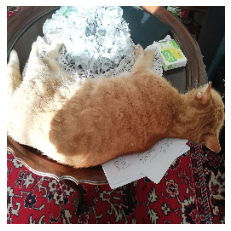


This image most likely belongs to dog with a 67.99 percent confidence.


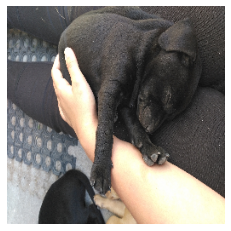


This image most likely belongs to dog with a 73.10 percent confidence.


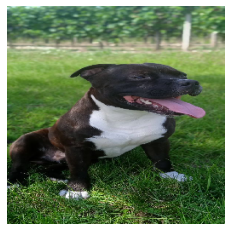


This image most likely belongs to cat with a 71.22 percent confidence.


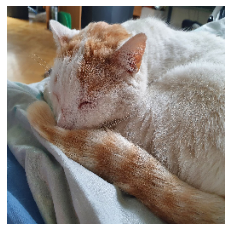


This image most likely belongs to cat with a 71.12 percent confidence.


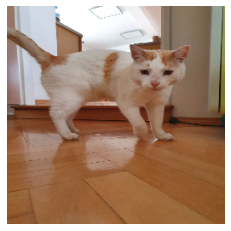


This image most likely belongs to cat with a 60.52 percent confidence.


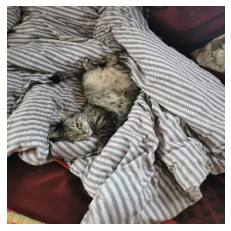


This image most likely belongs to dog with a 68.60 percent confidence.


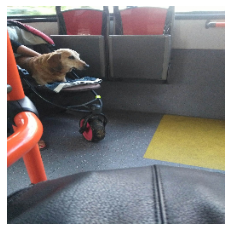


This image most likely belongs to cat with a 55.78 percent confidence.


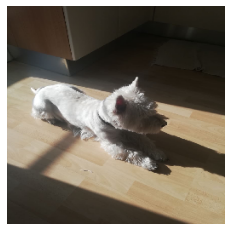


This image most likely belongs to dog with a 71.95 percent confidence.


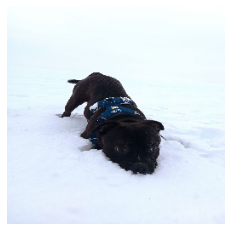


This image most likely belongs to dog with a 73.10 percent confidence.


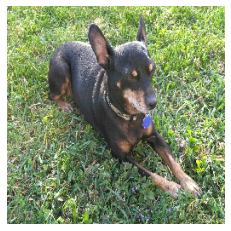


This image most likely belongs to dog with a 72.99 percent confidence.


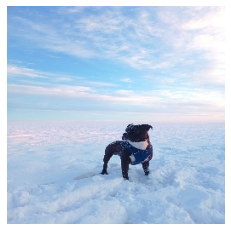


This image most likely belongs to dog with a 68.17 percent confidence.


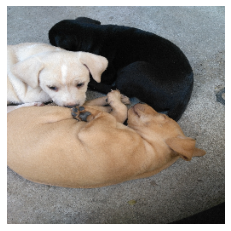


This image most likely belongs to dog with a 71.78 percent confidence.


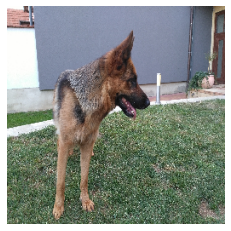


This image most likely belongs to cat with a 67.20 percent confidence.


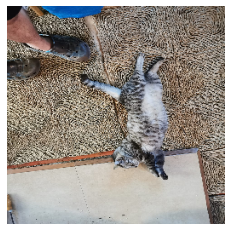


This image most likely belongs to cat with a 72.93 percent confidence.


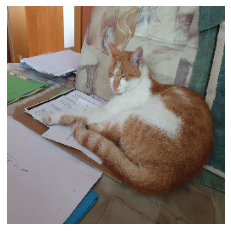


This image most likely belongs to cat with a 57.74 percent confidence.


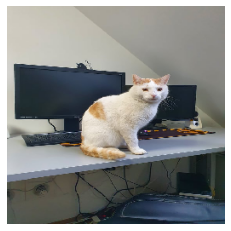


This image most likely belongs to dog with a 73.11 percent confidence.


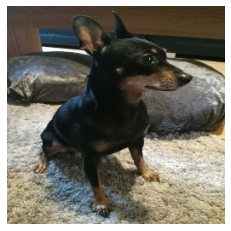

In [ ]:
for image_name in os.listdir('/content/OwnPets/'):
    img = tf.keras.utils.load_img(
        '/content/OwnPets/' + image_name, target_size=(256, 256)
    )
    img_array = tf.keras.utils.img_to_array(img)


    
    img_array_batch = tf.expand_dims(img_array, 0) # Create a batch


    predictions = model.predict(img_array_batch)
    score = tf.nn.softmax(predictions[0])

    print(
        "\nThis image most likely belongs to {} with a {:.2f} percent confidence."
        .format(classes[np.argmax(score)], 100 * np.max(score))
    )

    plt.imshow(img_array/255)
    plt.axis('off')
    plt.show()